# Setup and Dependancies

In [1]:
!pip install torch torchvision -f https://download.pytorch.org/whl/cu118
!pip install cython pyyaml
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'
!pip install roboflow kagglehub
print(torch.__version__, torch.cuda.is_available())
!gcc --version


Looking in links: https://download.pytorch.org/whl/cu118
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 60.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 43.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 52.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 76.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu1

In [22]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
from base64 import b64encode
from IPython.display import HTML
import torch, torchvision

# import some common libraries
import numpy as np
import cv2
import random
import kagglehub
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

# Dataset download in CoCo format
Dataset link: https://universe.roboflow.com/selfdriving-car-qtywx/self-driving-cars-lfjou/dataset/6


In [24]:
traffic_lights_video_path = kagglehub.dataset_download('matteoiorio/traffic-lights-video')

In [3]:
!curl -L "https://universe.roboflow.com/ds/Gs6zj5KPFT?key=0AZGRmTWIG" > roboflow.zip; unzip -o roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   901  100   901    0     0   1690      0 --:--:-- --:--:-- --:--:--  1690
100 98.2M  100 98.2M    0     0  11.9M      0  0:00:08  0:00:08 --:--:-- 17.3M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/000003_jpg.rf.8511b9c219dbf9799a6d58900b15917d.jpg  
 extracting: test/000006_jpg.rf.89610ec419ccfab22f8314026b90ee26.jpg  
 extracting: test/00000_00000_00003_png.rf.d18afc3c9625ffb1974029d3e3762aee.jpg  
 extracting: test/00000_00000_00005_png.rf.ab60a274676963d378f5014e89d9e2b1.jpg  
 extracting: test/00000_00000_00006_png.rf.9d1ea68507aff6973a1dbcdc6f4422a8.jpg  
 extracting: test/00000_00000_00008_png.rf.ff305dcd6e9ceb9188937311a4a1b207.jpg  
 extracting: test/00000_00000_00013_png.rf.9076cbfc7f7811fa22547539a7e7ac02.jpg  
 extracting: t

Registers COCO-format datasets for training, validation, and testing in Detectron2.
These registrations make the datasets accessible via DatasetCatalog and MetadataCatalog

In [4]:
from detectron2.data.datasets import register_coco_instances

register_coco_instances("dataset_train", {}, "train/_annotations.coco.json", "train")
register_coco_instances("dataset_val", {}, "valid/_annotations.coco.json", "valid")
register_coco_instances("dataset_test", {}, "test/_annotations.coco.json", "test")

Displays 6 randomly selected annotated images from the training dataset

WARNING [01/10 17:24:14 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/10 17:24:14 d2.data.datasets.coco]: Loaded 3530 images in COCO format from train/_annotations.coco.json


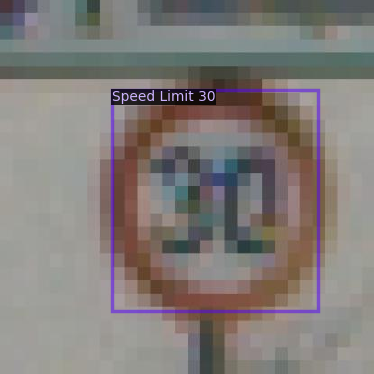

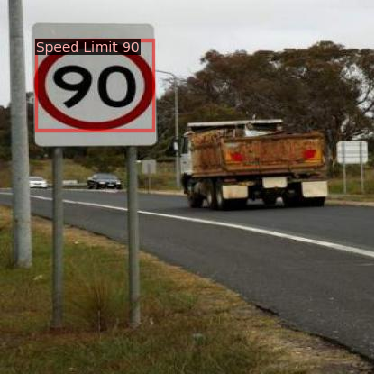

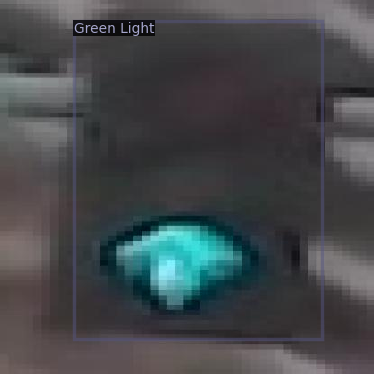

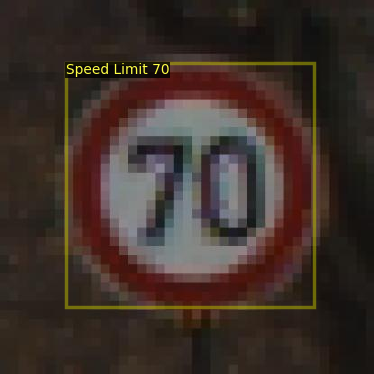

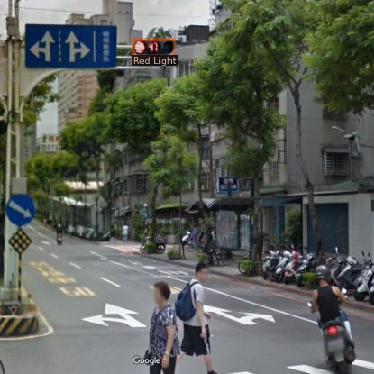

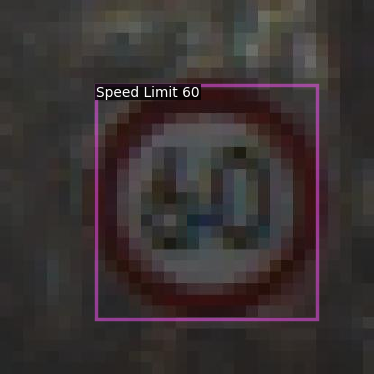

In [ ]:
my_dataset_train_metadata = MetadataCatalog.get("dataset_train")
dataset_dicts = DatasetCatalog.get("dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 6):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.9)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

Custom training workflow with CocoTrainer and a custom evaluator, MyCOCOEvaluator.

CocoTrainer: Overrides build_evaluator to use MyCOCOEvaluator, saving results in coco_eval.
MyCOCOEvaluator: Customizes prediction evaluation, handles category ID mapping, logs errors, and saves results to coco_instances_results.json.

# Fine Tuning

In [5]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator
import itertools
from detectron2.utils.file_io import PathManager
import json
import os

class CocoTrainer(DefaultTrainer):

    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):

        if output_folder is None:
            os.makedirs("coco_eval", exist_ok=True)
            output_folder = "coco_eval"

        return MyCOCOEvaluator(dataset_name, cfg, False, output_folder)

class MyCOCOEvaluator(COCOEvaluator):
    def _eval_predictions(self, predictions, img_ids=None):
        """
        Evaluate predictions on the given tasks.
        Fill self._results with the metrics of the tasks.
        """
        self._logger.info("Preparing results for COCO format ...")
        coco_results = list(itertools.chain(*[x["instances"] for x in predictions]))

        if hasattr(self._metadata, "thing_dataset_id_to_contiguous_id"):
            reverse_id_mapping = {
                v: k for k, v in self._metadata.thing_dataset_id_to_contiguous_id.items()
            }
            for result in coco_results:
                category_id = result["category_id"]

                # Check for incorrect category ID and print more information
                if category_id not in reverse_id_mapping:
                    print(f"Error: Prediction with category_id={category_id} not found in dataset mapping.")
                    print(f"Full prediction: {result}")
                    print(f"Image ID: {result['image_id']}")  # Print the image ID
                    print(f"Bounding box: {result['bbox']}")  # Print the bounding box
                else:
                    result["category_id"] = reverse_id_mapping[category_id]

        if self._output_dir:
            file_path = os.path.join(self._output_dir, "coco_instances_results.json")
            self._logger.info("Saving results to {}".format(file_path))
            with PathManager.open(file_path, "w") as f:
                f.write(json.dumps(coco_results))
                f.flush()

        if not self._do_evaluation:
            self._logger.info("Annotations are not available for evaluation.")
            return

        self._logger.info("Evaluating predictions ...")

In [ ]:
from detectron2.config import get_cfg
import os
from detectron2 import model_zoo

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_101_FPN_3x.yaml"))

cfg.DATASETS.TRAIN = ("dataset_train",)
cfg.DATASETS.TEST = ("dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_101_FPN_3x.yaml")

cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.005
cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 1750 * 5  # 5 epochs

cfg.SOLVER.STEPS = (int(cfg.SOLVER.MAX_ITER * 0.6), int(cfg.SOLVER.MAX_ITER * 0.8))
cfg.SOLVER.GAMMA = 0.1

cfg.MODEL.RETINANET.NUM_CLASSES = 16
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 16

cfg.TEST.EVAL_PERIOD = 1750  # Valid each epoch

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[01/10 08:55:27 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2)

model_final_971ab9.pkl: 228MB [00:01, 225MB/s]                           


[01/10 08:55:29 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:513: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3609.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[01/10 08:55:43 d2.utils.events]:  eta: 1:16:48  iter: 19  total_loss: 1.759  loss_cls: 1.458  loss_box_reg: 0.3247    time: 0.5917  last_time: 0.5412  data_time: 0.0220  last_data_time: 0.0156   lr: 9.9905e-05  max_mem: 4151M
[01/10 08:56:01 d2.utils.events]:  eta: 1:16:34  iter: 39  total_loss: 1.426  loss_cls: 1.262  loss_box_reg: 0.1863    time: 0.5425  last_time: 0.5291  data_time: 0.0119  last_data_time: 0.0102   lr: 0.00019981  max_mem: 4151M
[01/10 08:56:11 d2.utils.events]:  eta: 1:16:24  iter: 59  total_loss: 1.328  loss_cls: 1.146  loss_box_reg: 0.1687    time: 0.5281  last_time: 0.5315  data_time: 0.0118  last_data_time: 0.0101   lr: 0.0002997  max_mem: 4151M
[01/10 08:56:21 d2.utils.events]:  eta: 1:16:19  iter: 79  total_loss: 1.252  loss_cls: 1.117  loss_box_reg: 0.1558    time: 0.5221  last_time: 0.4674  data_time: 0.0119  last_data_time: 0.0112   lr: 0.00039961  max_mem: 4151M
[01/10 08:56:31 d2.utils.events]:  eta: 1:16:06  iter: 99  total_loss: 1.072  loss_cls: 0.944

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[01/10 09:10:14 d2.evaluation.evaluator]: Inference done 11/1884. Dataloading: 0.0011 s/iter. Inference: 0.0611 s/iter. Eval: 0.0003 s/iter. Total: 0.0625 s/iter. ETA=0:01:57
[01/10 09:10:19 d2.evaluation.evaluator]: Inference done 91/1884. Dataloading: 0.0016 s/iter. Inference: 0.0612 s/iter. Eval: 0.0003 s/iter. Total: 0.0632 s/iter. ETA=0:01:53
[01/10 09:10:24 d2.evaluation.evaluator]: Inference done 171/1884. Dataloading: 0.0017 s/iter. Inference: 0.0611 s/iter. Eval: 0.0003 s/iter. Total: 0.0632 s/iter. ETA=0:01:48
[01/10 09:10:29 d2.evaluation.evaluator]: Inference done 250/1884. Dataloading: 0.0017 s/iter. Inference: 0.0611 s/iter. Eval: 0.0003 s/iter. Total: 0.0632 s/iter. ETA=0:01:43
[01/10 09:10:34 d2.evaluation.evaluator]: Inference done 330/1884. Dataloading: 0.0017 s/iter. Inference: 0.0612 s/iter. Eval: 0.0003 s/iter. Total: 0.0632 s/iter. ETA=0:01:38
[01/10 09:10:39 d2.evaluation.evaluator]: Inference done 410/1884. Dataloading: 0.0017 s/iter. Inference: 0.0611 s/iter. E

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[01/10 09:26:46 d2.evaluation.evaluator]: Inference done 11/1884. Dataloading: 0.0015 s/iter. Inference: 0.0638 s/iter. Eval: 0.0003 s/iter. Total: 0.0657 s/iter. ETA=0:02:03
[01/10 09:26:51 d2.evaluation.evaluator]: Inference done 90/1884. Dataloading: 0.0018 s/iter. Inference: 0.0617 s/iter. Eval: 0.0003 s/iter. Total: 0.0639 s/iter. ETA=0:01:54
[01/10 09:26:56 d2.evaluation.evaluator]: Inference done 170/1884. Dataloading: 0.0017 s/iter. Inference: 0.0615 s/iter. Eval: 0.0003 s/iter. Total: 0.0635 s/iter. ETA=0:01:48
[01/10 09:27:01 d2.evaluation.evaluator]: Inference done 250/1884. Dataloading: 0.0017 s/iter. Inference: 0.0613 s/iter. Eval: 0.0003 s/iter. Total: 0.0634 s/iter. ETA=0:01:43
[01/10 09:27:06 d2.evaluation.evaluator]: Inference done 330/1884. Dataloading: 0.0017 s/iter. Inference: 0.0613 s/iter. Eval: 0.0003 s/iter. Total: 0.0633 s/iter. ETA=0:01:38
[01/10 09:27:11 d2.evaluation.evaluator]: Inference done 410/1884. Dataloading: 0.0017 s/iter. Inference: 0.0613 s/iter. E

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[01/10 09:43:20 d2.evaluation.evaluator]: Inference done 11/1884. Dataloading: 0.0014 s/iter. Inference: 0.0620 s/iter. Eval: 0.0003 s/iter. Total: 0.0637 s/iter. ETA=0:01:59
[01/10 09:43:25 d2.evaluation.evaluator]: Inference done 89/1884. Dataloading: 0.0019 s/iter. Inference: 0.0619 s/iter. Eval: 0.0003 s/iter. Total: 0.0641 s/iter. ETA=0:01:55
[01/10 09:43:30 d2.evaluation.evaluator]: Inference done 167/1884. Dataloading: 0.0019 s/iter. Inference: 0.0619 s/iter. Eval: 0.0003 s/iter. Total: 0.0642 s/iter. ETA=0:01:50
[01/10 09:43:35 d2.evaluation.evaluator]: Inference done 245/1884. Dataloading: 0.0019 s/iter. Inference: 0.0619 s/iter. Eval: 0.0003 s/iter. Total: 0.0642 s/iter. ETA=0:01:45
[01/10 09:43:40 d2.evaluation.evaluator]: Inference done 324/1884. Dataloading: 0.0019 s/iter. Inference: 0.0618 s/iter. Eval: 0.0003 s/iter. Total: 0.0641 s/iter. ETA=0:01:40
[01/10 09:43:45 d2.evaluation.evaluator]: Inference done 403/1884. Dataloading: 0.0019 s/iter. Inference: 0.0618 s/iter. E

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[01/10 09:59:54 d2.evaluation.evaluator]: Inference done 11/1884. Dataloading: 0.0012 s/iter. Inference: 0.0616 s/iter. Eval: 0.0003 s/iter. Total: 0.0632 s/iter. ETA=0:01:58
[01/10 09:59:59 d2.evaluation.evaluator]: Inference done 89/1884. Dataloading: 0.0019 s/iter. Inference: 0.0620 s/iter. Eval: 0.0003 s/iter. Total: 0.0643 s/iter. ETA=0:01:55
[01/10 10:00:04 d2.evaluation.evaluator]: Inference done 167/1884. Dataloading: 0.0019 s/iter. Inference: 0.0620 s/iter. Eval: 0.0003 s/iter. Total: 0.0643 s/iter. ETA=0:01:50
[01/10 10:00:09 d2.evaluation.evaluator]: Inference done 245/1884. Dataloading: 0.0019 s/iter. Inference: 0.0619 s/iter. Eval: 0.0003 s/iter. Total: 0.0642 s/iter. ETA=0:01:45
[01/10 10:00:14 d2.evaluation.evaluator]: Inference done 323/1884. Dataloading: 0.0020 s/iter. Inference: 0.0619 s/iter. Eval: 0.0003 s/iter. Total: 0.0642 s/iter. ETA=0:01:40
[01/10 10:00:19 d2.evaluation.evaluator]: Inference done 401/1884. Dataloading: 0.0020 s/iter. Inference: 0.0619 s/iter. E

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[01/10 10:16:28 d2.evaluation.evaluator]: Inference done 11/1884. Dataloading: 0.0014 s/iter. Inference: 0.0617 s/iter. Eval: 0.0003 s/iter. Total: 0.0633 s/iter. ETA=0:01:58
[01/10 10:16:33 d2.evaluation.evaluator]: Inference done 89/1884. Dataloading: 0.0019 s/iter. Inference: 0.0618 s/iter. Eval: 0.0003 s/iter. Total: 0.0641 s/iter. ETA=0:01:55
[01/10 10:16:39 d2.evaluation.evaluator]: Inference done 168/1884. Dataloading: 0.0019 s/iter. Inference: 0.0618 s/iter. Eval: 0.0003 s/iter. Total: 0.0641 s/iter. ETA=0:01:49
[01/10 10:16:44 d2.evaluation.evaluator]: Inference done 246/1884. Dataloading: 0.0019 s/iter. Inference: 0.0618 s/iter. Eval: 0.0003 s/iter. Total: 0.0641 s/iter. ETA=0:01:45
[01/10 10:16:49 d2.evaluation.evaluator]: Inference done 324/1884. Dataloading: 0.0019 s/iter. Inference: 0.0618 s/iter. Eval: 0.0003 s/iter. Total: 0.0641 s/iter. ETA=0:01:40
[01/10 10:16:54 d2.evaluation.evaluator]: Inference done 402/1884. Dataloading: 0.0020 s/iter. Inference: 0.0619 s/iter. E

In [ ]:
from detectron2.data import MetadataCatalog

metadata = MetadataCatalog.get("dataset_train")
print("Thing classes:", metadata.thing_classes)
print("Thing dataset ID to contiguous ID mapping:", metadata.thing_dataset_id_to_contiguous_id)


Thing classes: ['Signs', 'Green Light', 'Red Light', 'Speed Limit 10', 'Speed Limit 100', 'Speed Limit 110', 'Speed Limit 120', 'Speed Limit 20', 'Speed Limit 30', 'Speed Limit 40', 'Speed Limit 50', 'Speed Limit 60', 'Speed Limit 70', 'Speed Limit 80', 'Speed Limit 90', 'Stop']
Thing dataset ID to contiguous ID mapping: {0: 0, 1: 1, 2: 2, 3: 3, 4: 4, 5: 5, 6: 6, 7: 7, 8: 8, 9: 9, 10: 10, 11: 11, 12: 12, 13: 13, 14: 14, 15: 15}


In [28]:
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.engine import DefaultPredictor
import os

# Imposta la configurazione
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # Carica i pesi salvati
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # Imposta la soglia di confidenza per inferenza

# Crea il modello di inferenza
predictor = DefaultPredictor(cfg)

# Crea l'evaluator per la valutazione COCO
evaluator = COCOEvaluator("dataset_test", cfg, False, output_dir="./output/")

# Costruisci il dataloader per il dataset di test
val_loader = build_detection_test_loader(cfg, "dataset_test")

# Esegui la valutazione
inference_on_dataset(predictor.model, val_loader, evaluator)

[03/12 10:11:41 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


/usr/local/lib/python3.11/dist-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.device("cpu"))

WARNING [03/12 10:11:42 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [03/12 10:11:42 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/12 10:11:42 d2.data.datasets.coco]: Loaded 638 images in COCO format from test/_annotations.coco.json
[03/12 10:11:42 d2.data.build]: Distribution of instances among all 16 categories:
|   category    | #instances   |   category    | #instances   |   category    | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|:-------------:|:-------------|
|     Signs     | 0            |  Green Light  | 110          |   Red Light   | 94           |
| Speed Limit.. | 3            | Speed Limit.. | 46           | Speed Limit.. | 21           |
| Speed Limit.. | 44           | Speed Limit.. | 46           | Speed Limit.. | 60           |
| Speed Limit.. | 53        

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


[03/12 10:11:43 d2.evaluation.evaluator]: Inference done 11/638. Dataloading: 0.0010 s/iter. Inference: 0.0923 s/iter. Eval: 0.0003 s/iter. Total: 0.0936 s/iter. ETA=0:00:58
[03/12 10:11:48 d2.evaluation.evaluator]: Inference done 65/638. Dataloading: 0.0016 s/iter. Inference: 0.0920 s/iter. Eval: 0.0003 s/iter. Total: 0.0939 s/iter. ETA=0:00:53
[03/12 10:11:53 d2.evaluation.evaluator]: Inference done 117/638. Dataloading: 0.0028 s/iter. Inference: 0.0923 s/iter. Eval: 0.0003 s/iter. Total: 0.0955 s/iter. ETA=0:00:49
[03/12 10:11:58 d2.evaluation.evaluator]: Inference done 171/638. Dataloading: 0.0024 s/iter. Inference: 0.0924 s/iter. Eval: 0.0003 s/iter. Total: 0.0951 s/iter. ETA=0:00:44
[03/12 10:12:04 d2.evaluation.evaluator]: Inference done 223/638. Dataloading: 0.0027 s/iter. Inference: 0.0925 s/iter. Eval: 0.0003 s/iter. Total: 0.0956 s/iter. ETA=0:00:39
[03/12 10:12:09 d2.evaluation.evaluator]: Inference done 275/638. Dataloading: 0.0026 s/iter. Inference: 0.0927 s/iter. Eval: 0

OrderedDict([('bbox',
              {'AP': 75.05455547649198,
               'AP50': 89.57112962980369,
               'AP75': 83.12269582732738,
               'APs': 41.82056894041799,
               'APm': 80.81615759374678,
               'APl': 90.5962984502786,
               'AP-Signs': nan,
               'AP-Green Light': 50.60009014591744,
               'AP-Red Light': 43.06649991920691,
               'AP-Speed Limit 10': 33.584158415841586,
               'AP-Speed Limit 100': 81.93246953246803,
               'AP-Speed Limit 110': 79.3350930444559,
               'AP-Speed Limit 120': 86.19775262677487,
               'AP-Speed Limit 20': 86.48090723078829,
               'AP-Speed Limit 30': 83.43256120808361,
               'AP-Speed Limit 40': 85.45349307037125,
               'AP-Speed Limit 50': 80.23185981054077,
               'AP-Speed Limit 60': 84.83092210961523,
               'AP-Speed Limit 70': 82.58652609410377,
               'AP-Speed Limit 80': 85.556266

# Visualization of Predictions

# Evaluation
Mean Average Precision (mAP) on the validation set using standard COCO metrics, along with its normalized confusion matrix.

In [20]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

evaluator = COCOEvaluator("dataset_test", output_dir="./output/")
results = inference_on_dataset(predictor.model, val_loader, evaluator)

[04/07 22:45:34 d2.evaluation.evaluator]: Start inference on 638 batches


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


[04/07 22:45:35 d2.evaluation.evaluator]: Inference done 11/638. Dataloading: 0.0012 s/iter. Inference: 0.0941 s/iter. Eval: 0.0003 s/iter. Total: 0.0957 s/iter. ETA=0:00:59
[04/07 22:45:40 d2.evaluation.evaluator]: Inference done 63/638. Dataloading: 0.0024 s/iter. Inference: 0.0948 s/iter. Eval: 0.0003 s/iter. Total: 0.0976 s/iter. ETA=0:00:56
[04/07 22:45:45 d2.evaluation.evaluator]: Inference done 114/638. Dataloading: 0.0030 s/iter. Inference: 0.0952 s/iter. Eval: 0.0004 s/iter. Total: 0.0987 s/iter. ETA=0:00:51
[04/07 22:45:50 d2.evaluation.evaluator]: Inference done 166/638. Dataloading: 0.0026 s/iter. Inference: 0.0952 s/iter. Eval: 0.0003 s/iter. Total: 0.0983 s/iter. ETA=0:00:46
[04/07 22:45:55 d2.evaluation.evaluator]: Inference done 216/638. Dataloading: 0.0031 s/iter. Inference: 0.0956 s/iter. Eval: 0.0003 s/iter. Total: 0.0991 s/iter. ETA=0:00:41
[04/07 22:46:00 d2.evaluation.evaluator]: Inference done 267/638. Dataloading: 0.0029 s/iter. Inference: 0.0956 s/iter. Eval: 0

WARNING [04/07 22:34:14 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/07 22:34:14 d2.data.datasets.coco]: Loaded 801 images in COCO format from valid/_annotations.coco.json


<ipython-input-16-ffa2ea7ac001>:83: RuntimeWarning: invalid value encountered in divide
  conf_matrix_norm = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]


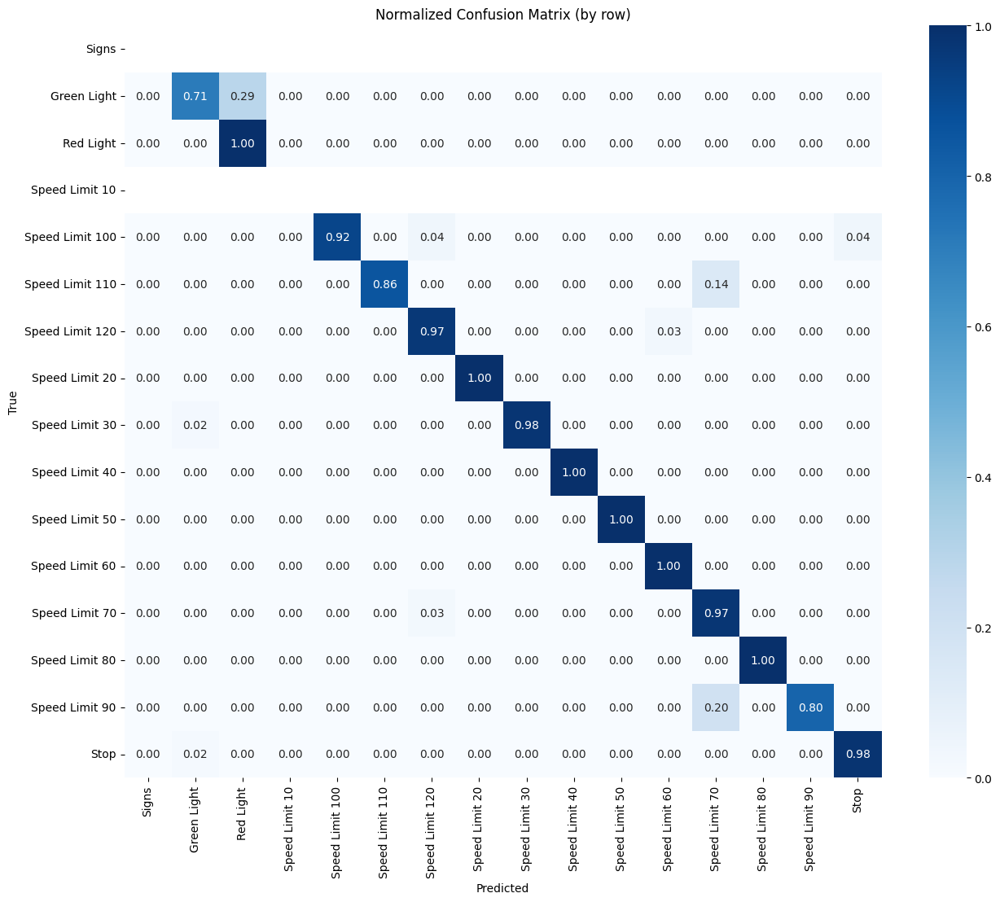

In [16]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from detectron2.data import DatasetCatalog

def get_annotations_and_predictions_aligned(cfg, predictor, dataset_name):
    dataset_dicts = DatasetCatalog.get(dataset_name)
    metadata = MetadataCatalog.get(dataset_name)
    true_labels = []
    pred_labels = []

    for d in dataset_dicts:
        im = cv2.imread(d["file_name"])
        outputs = predictor(im)

        instances = outputs["instances"]
        keep = instances.scores > cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST
        instances = instances[keep]

        pred_classes = instances.pred_classes.cpu().numpy()
        pred_boxes = instances.pred_boxes.tensor.cpu().numpy()

        gt_classes = [anno["category_id"] for anno in d["annotations"]]
        gt_boxes = [anno["bbox"] for anno in d["annotations"]]

        # (IOU > 0.5)
        for gt_class, gt_box in zip(gt_classes, gt_boxes):
            matched = False
            for pred_class, pred_box in zip(pred_classes, pred_boxes):
                iou = compute_iou(gt_box, pred_box)
                if iou > 0.5:
                    true_labels.append(gt_class)
                    pred_labels.append(pred_class)
                    matched = True
                    break

            if not matched:
                true_labels.append(gt_class)
                pred_labels.append(-1)

    return true_labels, pred_labels

def compute_iou(box1, box2):
    x1, y1, w1, h1 = box1
    x2, y2, w2, h2 = box2

    box1 = [x1, y1, x1 + w1, y1 + h1]
    box2 = [x2, y2, x2 + w2, y2 + h2]

    xi1 = max(box1[0], box2[0])
    yi1 = max(box1[1], box2[1])
    xi2 = min(box1[2], box2[2])
    yi2 = min(box1[3], box2[3])
    inter_area = max(xi2 - xi1, 0) * max(yi2 - yi1, 0)

    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])

    union_area = box1_area + box2_area - inter_area
    return inter_area / union_area if union_area > 0 else 0

true_labels, pred_labels = get_annotations_and_predictions_aligned(cfg, predictor, "dataset_val")

valid_indices = [i for i, pred in enumerate(pred_labels) if pred != -1]
true_labels = [true_labels[i] for i in valid_indices]
pred_labels = [pred_labels[i] for i in valid_indices]

conf_matrix = confusion_matrix(true_labels, pred_labels, labels=range(len(metadata.thing_classes)))

conf_matrix_norm = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]

plt.figure(figsize=(15, 12))
sns.heatmap(conf_matrix_norm, annot=True, fmt='.2f', cmap='Blues',
            xticklabels=metadata.thing_classes,
            yticklabels=metadata.thing_classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Normalized Confusion Matrix (by row)')
plt.show()

Processing ./test/00000_00005_00027_png.rf.397ea37e7f1f7c3029ef77da37b4d73a.jpg
Class: Speed Limit 20, Score: 1.00


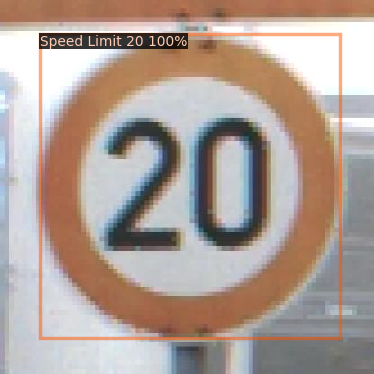

Processing ./test/road485_png.rf.27b8f614cd9acbfc022c4c40b8707cbf.jpg
Class: Speed Limit 80, Score: 0.95


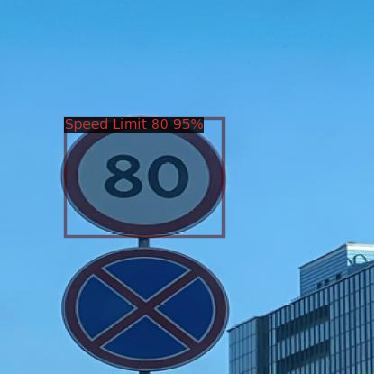

Processing ./test/00001_00037_00008_png_jpg.rf.5032c7a02aea1e141c88f682d5686416.jpg
Class: Speed Limit 30, Score: 0.99


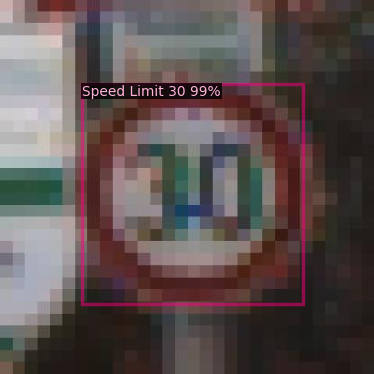

Processing ./test/000166_jpg.rf.f37d1c743a28243f0e0f2482f2a67290.jpg
Class: Speed Limit 50, Score: 0.96


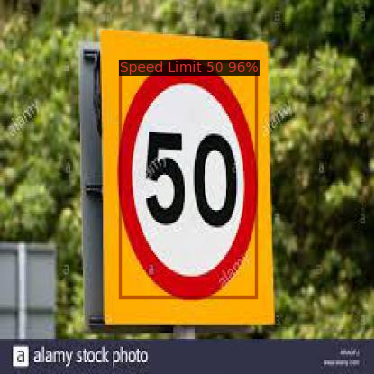

Processing ./test/road431_png.rf.4cf451707a1af9d139094513881b7654.jpg


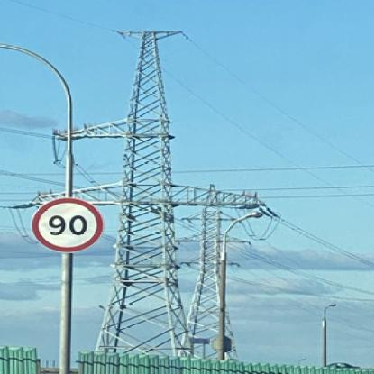

Processing ./test/00001_00058_00017_png_jpg.rf.8afe702d091404d4223964dd67fdf735.jpg
Class: Speed Limit 30, Score: 0.98


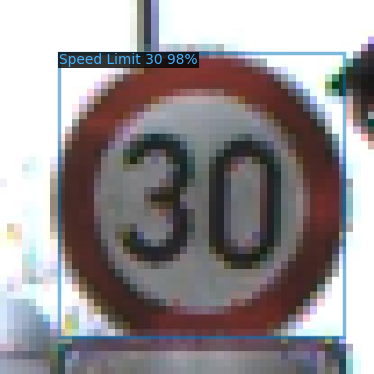

Processing ./test/00000_00003_00017_png_jpg.rf.0325f56db35d0ec26db044c5d37c6605.jpg
Class: Speed Limit 20, Score: 0.99


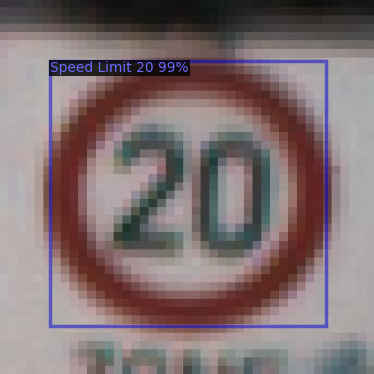

Processing ./test/00001_00040_00022_png_jpg.rf.870b174c33b5f3a099b161d332602cdc.jpg
Class: Speed Limit 30, Score: 0.98


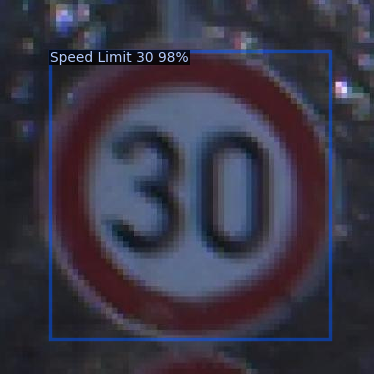

Processing ./test/00041_00001_00008_png_jpg.rf.114ece61462b432fcbdcf5a121f4cc0e.jpg


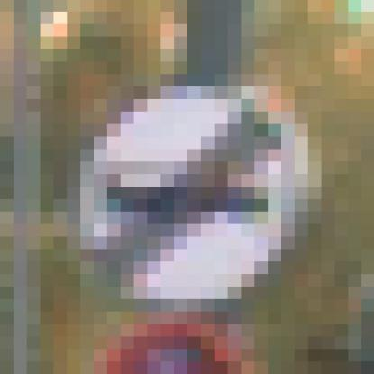

Processing ./test/00008_00043_00018_png.rf.cb403d912587a88325e095df6ab3f1df.jpg
Class: Speed Limit 120, Score: 0.97


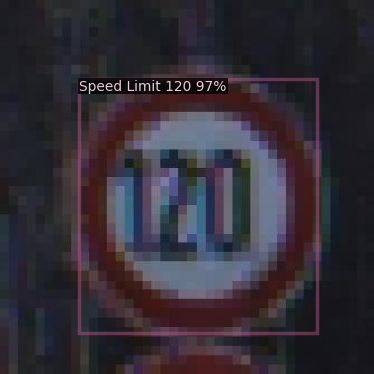

Processing ./test/00001_00036_00028_png_jpg.rf.1a9dfeda2aa831f1b85c516e065baa3a.jpg
Class: Speed Limit 30, Score: 0.97


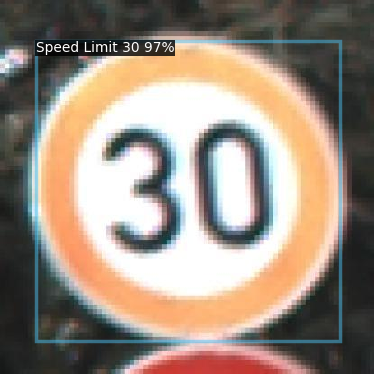

Processing ./test/00000_00005_00025_png.rf.f6c63209955abab1fc2ea39248553192.jpg
Class: Speed Limit 20, Score: 1.00


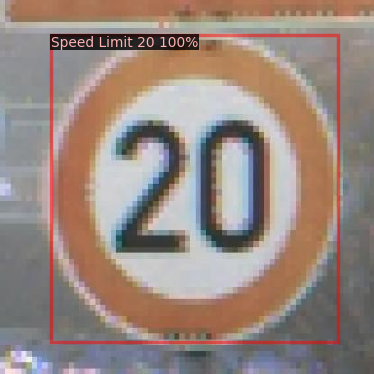

Processing ./test/00007_00002_00021_png.rf.3e8282102bcbc3465886670d060ce78f.jpg
Class: Speed Limit 100, Score: 0.96


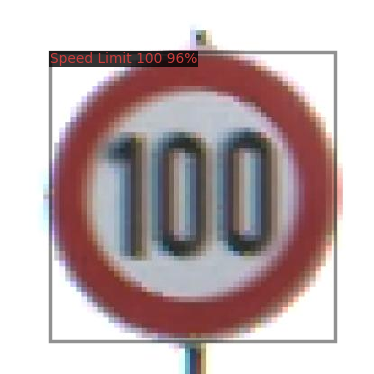

Processing ./test/00001_00069_00004_png_jpg.rf.d8dd0ad2baf8a420fe625131c79c83ec.jpg
Class: Speed Limit 30, Score: 0.95


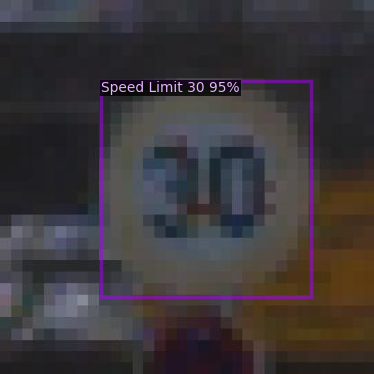

Processing ./test/00001_00041_00028_png_jpg.rf.ff96dfbf58a2a74f1b79f3c1bce24680.jpg
Class: Speed Limit 30, Score: 0.98


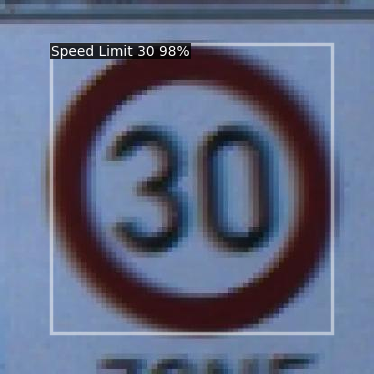

Processing ./test/00001_00072_00024_png_jpg.rf.03b1b9e5ffc3d16bb4fd65122689cd6c.jpg
Class: Speed Limit 30, Score: 0.97


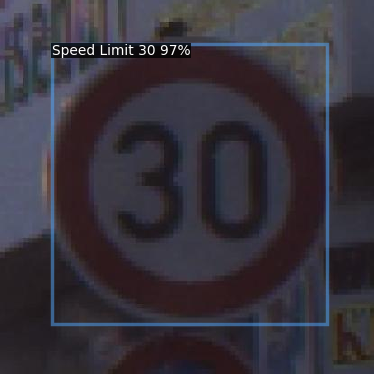

Processing ./test/000289_jpg.rf.5bcff3507297a43a567fd64d593fd533.jpg
Class: Speed Limit 40, Score: 0.99


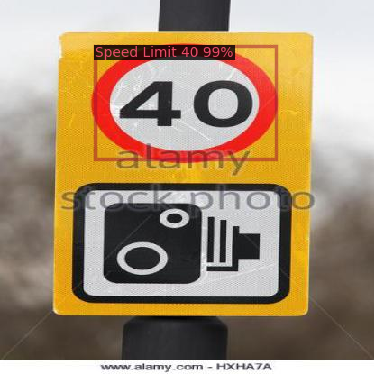

Processing ./test/00001_00065_00027_png_jpg.rf.69448e68665db08213531a34b01a1a4a.jpg
Class: Speed Limit 30, Score: 0.98


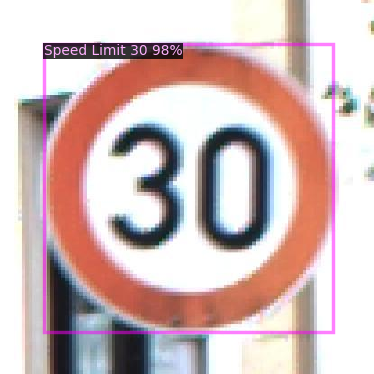

Processing ./test/000664_jpg.rf.882fdd90b90c7f1af1fc37a7467443cf.jpg
Class: Speed Limit 80, Score: 0.98
Class: Speed Limit 50, Score: 0.95


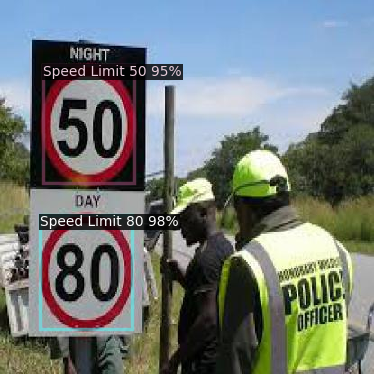

Processing ./test/road859_png.rf.f0e4bbd39d237c79817d4ade35676364.jpg


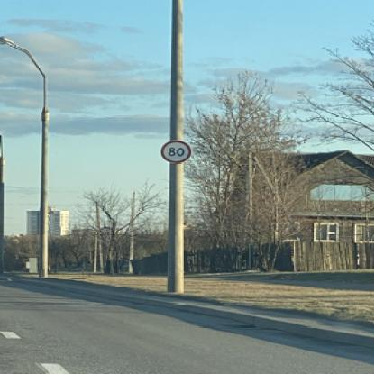

Processing ./test/00000_00001_00023_png_jpg.rf.ce6296ebaca17209ea86845a4d8c4b94.jpg
Class: Speed Limit 20, Score: 0.99


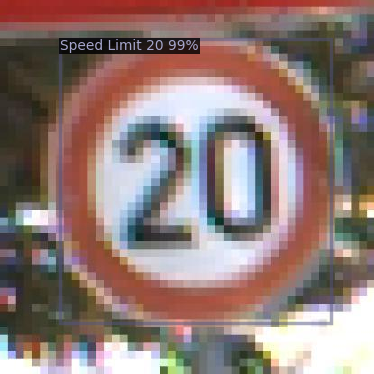

Processing ./test/00001_00072_00011_png_jpg.rf.47a2839229da886461905f0fdc92cd1c.jpg
Class: Speed Limit 30, Score: 0.96


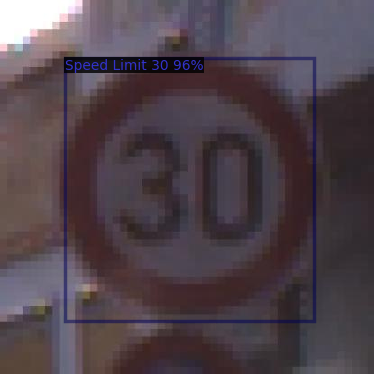

Processing ./test/00000_00002_00000_png_jpg.rf.e547a67e8f2340c3302052b19976e140.jpg
Class: Speed Limit 20, Score: 0.92


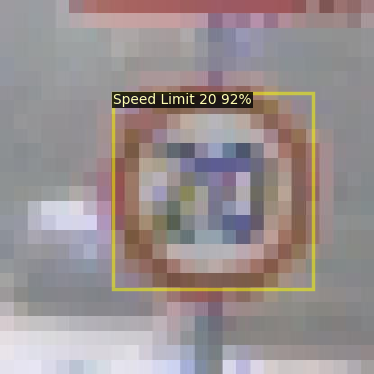

Processing ./test/001259_jpg.rf.b55c7e7dacc1e607f8e69b2a5cc36568.jpg


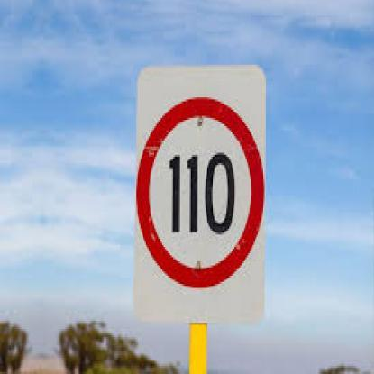

Processing ./test/road314_png.rf.697a2d138347ee6ee2da288b2ffe8e9d.jpg
Class: Speed Limit 40, Score: 0.98


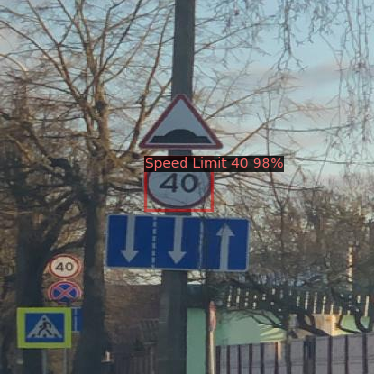

Processing ./test/00000_00000_00026_png_jpg.rf.988f796ce4fb3a032a91e712626f4c8f.jpg
Class: Speed Limit 20, Score: 0.99


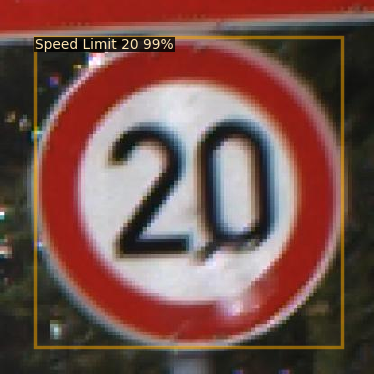

Processing ./test/00001_00038_00012_png.rf.769276765c04567a8afdd2300298c7cb.jpg
Class: Speed Limit 30, Score: 0.97


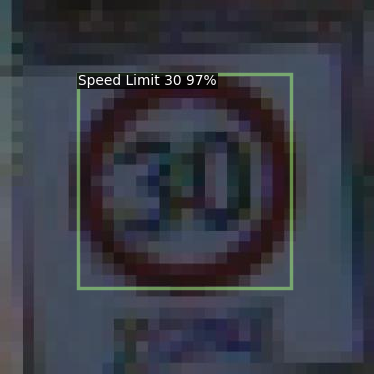

Processing ./test/00041_00002_00011_png_jpg.rf.f110066836a6f776e0c123ff75e60244.jpg


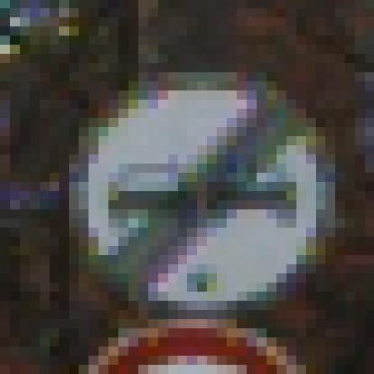

Processing ./test/00001_00064_00023_png_jpg.rf.8feeedcccb9201cff84c3eb94ca1b11a.jpg
Class: Speed Limit 30, Score: 0.98


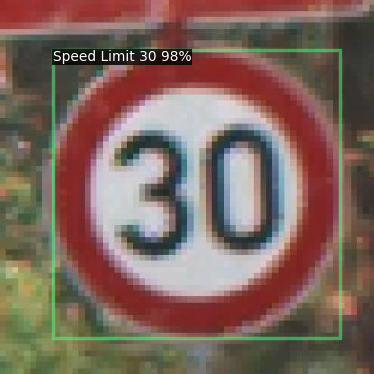

Processing ./test/00000_00002_00004_png_jpg.rf.92151c29cbf3984ff656aa231cb0bef9.jpg
Class: Speed Limit 20, Score: 0.97


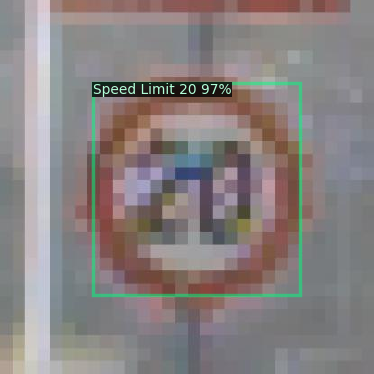

Processing ./test/00041_00000_00011_png_jpg.rf.35b83f6f2e4e5cb42a1c2710aca955a5.jpg


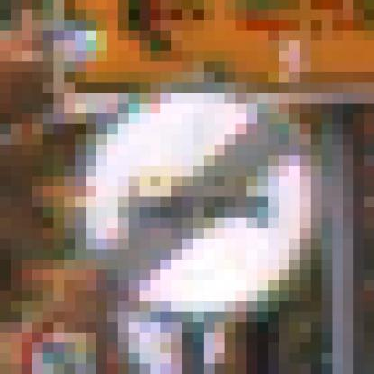

Processing ./test/FisheyeCamera_1_00018_png.rf.765c48e66c9a0a7d70f6e4b0af00494c.jpg


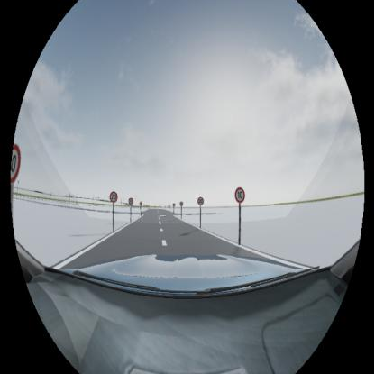

Processing ./test/000629_jpg.rf.7fc79b6ca0f85116dc5588dd6869900c.jpg
Class: Speed Limit 80, Score: 0.92


In [ ]:
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.engine import DefaultPredictor
import glob
import cv2
from google.colab.patches import cv2_imshow

metadata = MetadataCatalog.get("dataset_test")
for imageName in glob.glob('./test/*jpg'):
    print("Processing", imageName)

    im = cv2.imread(imageName)
    outputs = predictor(im)

    instances = outputs["instances"]
    scores = instances.scores
    threshold = 0.50
    keep = scores > threshold
    instances = instances[keep]
    outputs["instances"] = instances

    v = Visualizer(im[:, :, ::-1], metadata=metadata, scale=0.9)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    pred_classes = instances.pred_classes.cpu().numpy()
    class_names = [metadata.thing_classes[i] for i in pred_classes]

    for class_name, score in zip(class_names, scores[keep].cpu().numpy()):
        print(f"Class: {class_name}, Score: {score:.2f}")

    cv2_imshow(out.get_image()[:, :, ::-1])


# Object Tracking

In [12]:
class RetinaNetDetector:
    def __init__(self, predictor):
        self.predictor = predictor

    def detect_single_frame(self, frame, score_threshold=0.5):
        """Runs object detection on a single frame using RetinaNet."""
        outputs = self.predictor(frame)
        instances = outputs["instances"]
        scores = instances.scores.cpu().numpy()
        boxes = instances.pred_boxes.tensor.cpu().numpy()
        pred_classes = instances.pred_classes.cpu().numpy()

        keep = scores > score_threshold
        return boxes[keep], pred_classes[keep], scores[keep]

In [15]:
def compute_iou(boxA, boxB):
    """Computes the Intersection over Union (IoU) between two bounding boxes."""
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    interArea = max(0, xB - xA) * max(0, yB - yA)
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

    iou = interArea / float(boxAArea + boxBArea - interArea)
    return iou

class IOUTracker:
    def __init__(self, iou_threshold=0.5):
        self.iou_threshold = iou_threshold
        self.tracked_objects = {}
        self.next_object_id = 0

    def update(self, detections):
        """Updates object tracking based on new detections."""
        updated_objects = {}

        for det in detections:
            best_match_id = None
            best_iou = self.iou_threshold

            for obj_id, prev_box in self.tracked_objects.items():
                iou = compute_iou(prev_box, det)
                if iou > best_iou:
                    best_iou = iou
                    best_match_id = obj_id

            if best_match_id is not None:
                updated_objects[best_match_id] = det
            else:
                updated_objects[self.next_object_id] = det
                self.next_object_id += 1

        self.tracked_objects = updated_objects
        return updated_objects


In [30]:
# Function to process a video and apply object tracking
def create_new_video(video_name: str, detector, class_names=None):
    """
    Processes a video to detect and track objects, saving the result as a new video.
    """
    input_path = os.path.join(traffic_lights_video_path, video_name)
    output_video_path = video_name.split('.')[0] + "-output.mp4"

    cap = cv2.VideoCapture(input_path)
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    fourcc = cv2.VideoWriter_fourcc(*'XVID')
    out = cv2.VideoWriter(output_video_path, fourcc, fps, (frame_width, frame_height))

    tracker = IOUTracker(iou_threshold=0.5)

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Run detection
        filtered_boxes, filtered_classes, filtered_scores = detector.detect_single_frame(frame)

        # Skip processing if no objects are detected
        if len(filtered_boxes) == 0:
            out.write(frame)
            continue

        # Update tracker
        tracked_objects = tracker.update(filtered_boxes)

        for obj_id, box in tracked_objects.items():
            x1, y1, x2, y2 = map(int, box)
            class_name = filtered_classes[list(tracked_objects.keys()).index(obj_id)]
            if class_names is not None:
                class_name = class_names[class_name]
            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(frame, f'ID {obj_id}: {class_name}', (x1, y1 - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

        out.write(frame)

    cap.release()
    out.release()
    return output_video_path


In [31]:
predictor = DefaultPredictor(cfg)
detector = RetinaNetDetector(predictor)

# Print available files in the video folder
print(os.listdir(traffic_lights_video_path))

video_filename = "traffic_lights_1.mp4"
processed_video = create_new_video(video_filename, detector)

with open(processed_video, 'rb') as f:
    mp4_data = f.read()

data_url = "data:video/mp4;base64," + b64encode(mp4_data).decode()
HTML(f""" <video controls><source src="{data_url}" type="video/mp4"></video> """)

[03/12 10:24:05 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


/usr/local/lib/python3.11/dist-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.device("cpu"))

['traffic_lights_red_1.mp4', 'yolo_best_traffic.pt', 'traffic_lights_1.mp4', 'road_video_1.mp4', 'traffic_lights_2.mp4', 'traffic_light_3.mp4']
